In [1]:
using Interpolations
using NPZ
using Plots
using PyPlot 
import PyPlot
using LaTeXStrings
using Statistics
using PyCall
using FFTW

LoadError: [91mArgumentError: Package Interpolations not found in current path:[39m
[91m- Run `import Pkg; Pkg.add("Interpolations")` to install the Interpolations package.[39m


In [2]:
using Printf
using Plots.PlotMeasures

LoadError: [91mArgumentError: Package Plots not found in current path:[39m
[91m- Run `import Pkg; Pkg.add("Plots")` to install the Plots package.[39m


In [3]:
filepath = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/int_kink/11/300x/numpy_arrays/"

"/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/int_kink/11/300x/numpy_arrays/"

In [4]:
include("fftUtils.jl")
using .fftUtils

In [5]:
q = npzread(filepath * "q_mpi_800_980.npy");
q2 = npzread(filepath * "q_mpi_2.npy");
q3 = npzread(filepath * "q_mpi_3.npy");

In [8]:
#Bpsi = npzread(filepath * "b_hat_rho_mpi.npy");
Bpsi2 = npzread(filepath * "b_hat_rho_mpi_2.npy");
Bpsi3 = npzread(filepath * "b_hat_rho_mpi_3.npy");

In [10]:
qtot = cat(q2,q3,dims=2);

In [14]:
Bpsi_tot = cat(Bpsi2,Bpsi3,dims=4);

In [16]:
# Fourier Transform
#Fn = fft(Bpsi,3);
#F = fft(Bpsi,[2,3]);
Fntot = fft(Bpsi_tot,3);
Ftot = fft(Bpsi_tot,[2,3]);

In [17]:
# getting the dimensions
rdim = size(Bpsi_tot)[1];
ufdim = size(Bpsi_tot)[2];
fidim = size(Bpsi_tot)[3];
tdim = size(Bpsi_tot)[4];
time_list = LinRange(1,tdim,tdim);
psin_list = LinRange(0,1.0,rdim);
uf_list = LinRange(0,2*pi,ufdim);
fi_list = LinRange(0,2*pi,fidim);
Nn = fidim;
Nm = ufdim;

In [7]:
psi_grid = LinRange(0,1,size(q)[1]);

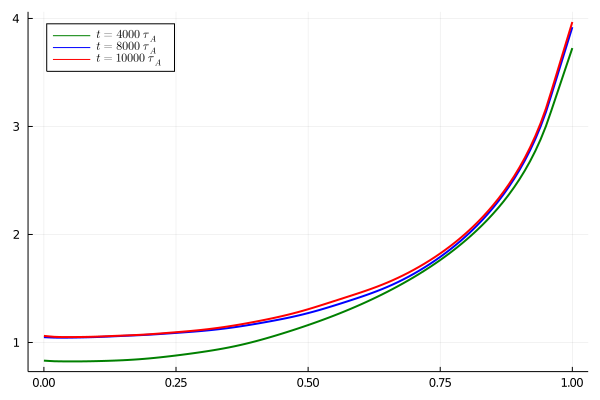

In [23]:
Plots.plot(psi_grid,-q2[:,1],linewidth=2,color="green",label=L"$t = 4000\;\tau_A$",legend=:topleft)
Plots.plot!(psi_grid,-q[:,1],linewidth=2,color="blue",label=L"$t = 8000\;\tau_A$")
Plots.plot!(psi_grid,-q[:,end],linewidth=2,color="red",label=L"$t = 10000\;\tau_A$")
#ylabel(L"$q$")
#xlabel(L"$\Psi_n$")

In [59]:
using QuadGK

In [18]:
ymin = 0.0;
ymax = 0.1;

anim = Plots.Animation()
for t in 1:tdim
    Plots.plot(psi_grid,-imag(Fn[:,1,2,t]),xlims=(0,1),ylims=(ymin,ymax),color="red",labels=("n=1"),legend=:bottomright)
    Plots.plot!(psi_grid,-imag(Fn[:,1,3,t]),xlims=(0,1),ylims=(ymin,ymax),color="green",labels=("n=2"),legend=:bottomright)
    Plots.plot!(psi_grid,-imag(Fn[:,1,4,t]),xlims=(0,1),ylims=(ymin,ymax),color="blue",labels=("n=3"),legend=:bottomright)
    Plots.plot!(psi_grid,-imag(Fn[:,1,5,t]),xlims=(0,1),ylims=(ymin,ymax),color="orange",labels=("n=4"),legend=:bottomright)   
    xlabel!(L"$\Psi_n$")
    ylabel!(L"$\textrm{Im}(\hat{b}^{\rho}_{m/n})$")
    time=t
    annotate!((0.9,0.03,"t="*string(time*10)))
    Plots.frame(anim)
end

┌ Info: Saved animation to 
│   fn = /turquoise/users/giannis_kx/Julia/tmp.gif
└ @ Plots /users/giannis_kx/.julia/packages/Plots/Awg62/src/animation.jl:104


Plots.AnimatedGif("/turquoise/users/giannis_kx/Julia/tmp.gif")
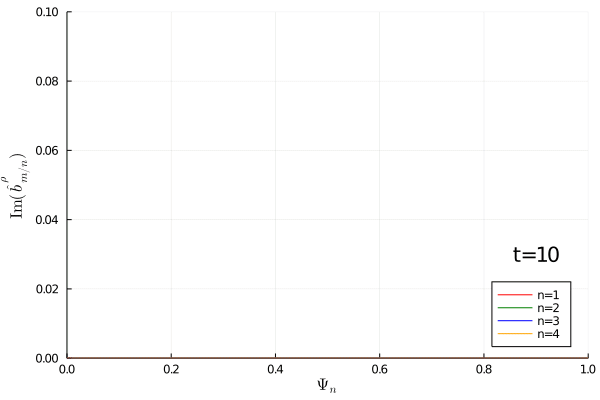

In [19]:
gif(anim,fps=30)

In [26]:
anim = Plots.Animation()
for t in 1:tdim
    Plots.plot(psi_grid,-q[:,t],xlims=(0,1),color="red")
    xlabel!(L"$\Psi_n$")
    ylabel!(L"$q(\psi)$")
    time=t
    annotate!((0.9,1.0,"t="*string(time*10)))
    Plots.frame(anim)
end

┌ Info: Saved animation to 
│   fn = /turquoise/users/giannis_kx/Julia/tmp.gif
└ @ Plots /users/giannis_kx/.julia/packages/Plots/Awg62/src/animation.jl:104


Plots.AnimatedGif("/turquoise/users/giannis_kx/Julia/tmp.gif")
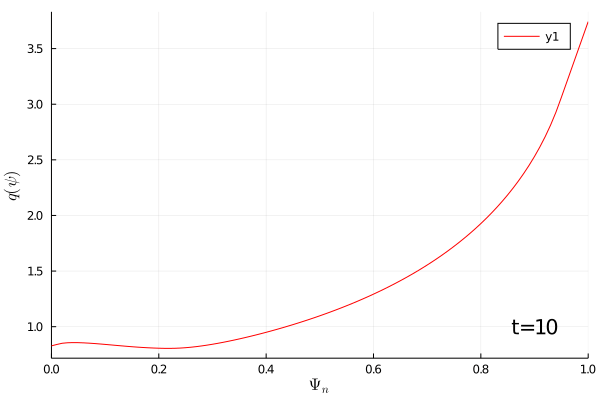

In [27]:
gif(anim,fps=30)

In [32]:
ymin = 0.0;
ymax = 0.5;

anim = Plots.Animation()
for t in 1:tdim
    Plots.plot(psi_grid,-imag(F[:,fftUtils.m_mode_ind(1,Nm),2,t]),xlims=(0,1),ylims=(ymin,ymax),color="red",labels=("n=1,m=1"),legend=:bottomright)
    Plots.plot!(psi_grid,-imag(F[:,fftUtils.m_mode_ind(2,Nm),2,t]),xlims=(0,1),ylims=(ymin,ymax),color="green",labels=("n=1,m=2"),legend=:bottomright)
    Plots.plot!(psi_grid,-imag(F[:,fftUtils.m_mode_ind(3,Nm),2,t]),xlims=(0,1),ylims=(ymin,ymax),color="blue",labels=("n=1,m=3"),legend=:bottomright)
    Plots.plot!(psi_grid,-imag(F[:,fftUtils.m_mode_ind(4,Nm),2,t]),xlims=(0,1),ylims=(ymin,ymax),color="orange",labels=("n=1,m=4"),legend=:bottomright)   
    xlabel!(L"$\Psi_n$")
    ylabel!(L"$\textrm{Im}(\hat{b}^{\rho}_{m/1})$")
    time=t
    annotate!((0.9,0.2,"t="*string(time*10)))
    Plots.frame(anim)
end

┌ Info: Saved animation to 
│   fn = /turquoise/users/giannis_kx/Julia/tmp.gif
└ @ Plots /users/giannis_kx/.julia/packages/Plots/Awg62/src/animation.jl:104


Plots.AnimatedGif("/turquoise/users/giannis_kx/Julia/tmp.gif")
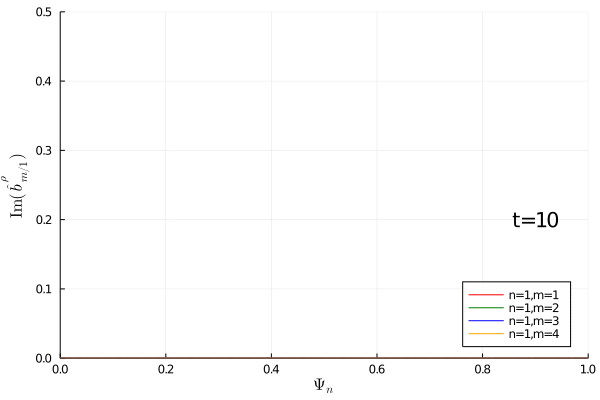

In [34]:
gif(anim,fps=30)

In [39]:
ymin = 0.0;
ymax = 0.03;

anim = Plots.Animation()
for t in 1:tdim
    Plots.plot(psi_grid,-imag(F[:,fftUtils.m_mode_ind(1,Nm),5,t]),xlims=(0,1),ylims=(ymin,ymax),color="red",labels=("n=4,m=1"),legend=:bottomright)
    Plots.plot!(psi_grid,-imag(F[:,fftUtils.m_mode_ind(2,Nm),5,t]),xlims=(0,1),ylims=(ymin,ymax),color="green",labels=("n=4,m=2"),legend=:bottomright)
    Plots.plot!(psi_grid,-imag(F[:,fftUtils.m_mode_ind(3,Nm),5,t]),xlims=(0,1),ylims=(ymin,ymax),color="blue",labels=("n=4,m=3"),legend=:bottomright)
    Plots.plot!(psi_grid,-imag(F[:,fftUtils.m_mode_ind(4,Nm),5,t]),xlims=(0,1),ylims=(ymin,ymax),color="orange",labels=("n=4,m=4"),legend=:bottomright)   
    xlabel!(L"$\Psi_n$")
    ylabel!(L"$\textrm{Im}(\hat{b}^{\rho}_{m/4})$")
    time=t
    annotate!((0.9,0.018,"t="*string(time*10)))
    Plots.frame(anim)
end

┌ Info: Saved animation to 
│   fn = /turquoise/users/giannis_kx/Julia/tmp.gif
└ @ Plots /users/giannis_kx/.julia/packages/Plots/Awg62/src/animation.jl:104


Plots.AnimatedGif("/turquoise/users/giannis_kx/Julia/tmp.gif")
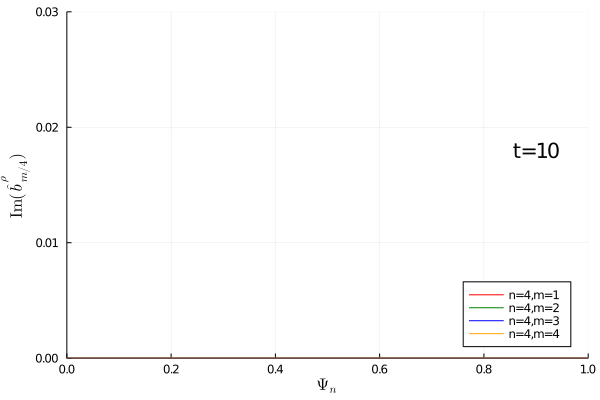

In [40]:
gif(anim,fps=30)

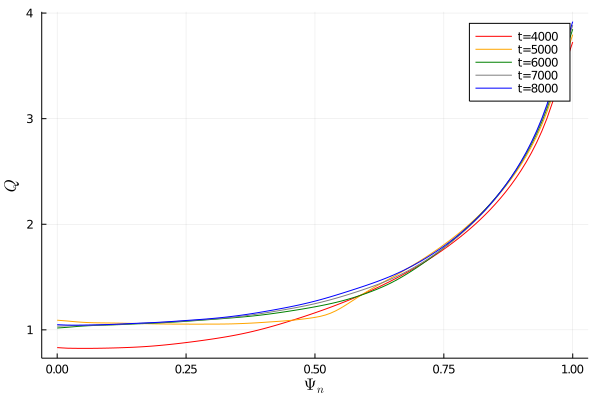

In [21]:
Plots.plot(psi_grid,-qtot[:,1],color="red",labels="t=4000")
Plots.plot!(psi_grid,-qtot[:,101],color="orange",labels="t=5000")
Plots.plot!(psi_grid,-qtot[:,201],color="green",labels="t=6000")
Plots.plot!(psi_grid,-qtot[:,301],color="gray",labels="t=7000")
Plots.plot!(psi_grid,-qtot[:,end],color="blue",labels="t=8000")
xlabel!(L"$\Psi_n$")
ylabel!(L"$Q$")

After $t=5000 \;t_A$ the q-profile remains greater than 1.

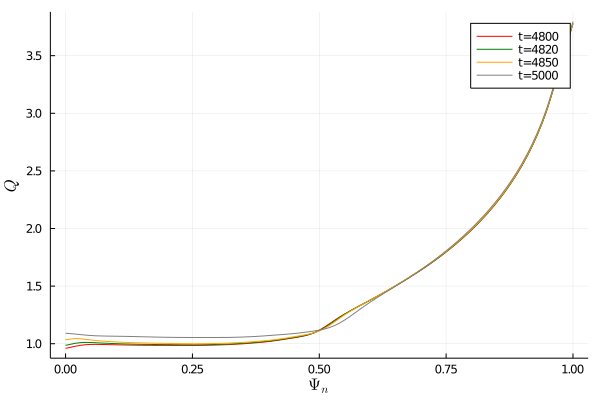

In [24]:
Plots.plot(psi_grid,-qtot[:,81],color="red",labels="t=4800")
Plots.plot!(psi_grid,-qtot[:,83],color="green",labels="t=4820")
Plots.plot!(psi_grid,-qtot[:,86],color="orange",labels="t=4850")
Plots.plot!(psi_grid,-qtot[:,101],color="gray",labels="t=5000")
#Plots.plot!(psi_grid,-qtot[:,end],color="blue",labels="t=8000")
xlabel!(L"$\Psi_n$")
ylabel!(L"$Q$")

It appears that around $t=4820 \;t_A$ q raises above 1.

In [66]:
ymin = -0.2;
ymax = 0.8;

anim = Plots.Animation()
for t in 1:10:tdim
    Plots.plot(psi_grid,-imag(Fntot[:,1,2,t]),xlims=(0,1),ylims=(ymin,ymax),color="red",labels=("n=1"),legend=:bottomright)
    Plots.plot!(psi_grid,-imag(Fntot[:,1,3,t]),xlims=(0,1),ylims=(ymin,ymax),color="green",labels=("n=2"),legend=:bottomright)
    Plots.plot!(psi_grid,-imag(Fntot[:,1,4,t]),xlims=(0,1),ylims=(ymin,ymax),color="orange",labels=("n=3"),legend=:bottomright)
    Plots.plot!(psi_grid,-imag(Fntot[:,1,5,t]),xlims=(0,1),ylims=(ymin,ymax),color="blue",labels=("n=4"),legend=:bottomright)
    xlabel!(L"$\Psi_n$")
    ylabel!(L"$\textrm{Im}(\hat{b}^{\rho}_{n})$")
    time=t
    annotate!((0.9,0.2,"t="*string(4000+time*10)))
    Plots.frame(anim)
end

┌ Info: Saved animation to 
│   fn = /turquoise/users/giannis_kx/Julia/tmp.gif
└ @ Plots /users/giannis_kx/.julia/packages/Plots/Awg62/src/animation.jl:104


Plots.AnimatedGif("/turquoise/users/giannis_kx/Julia/tmp.gif")
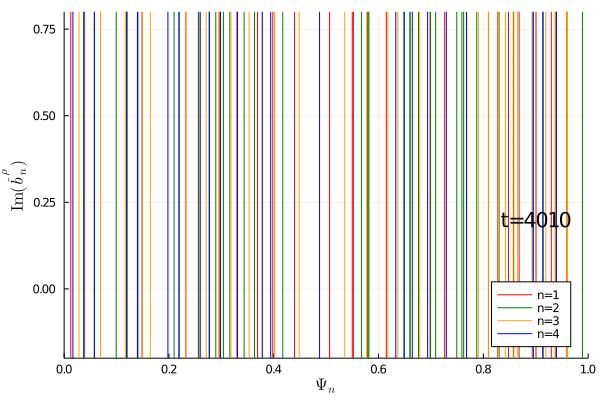

In [67]:
gif(anim,fps=10)